# Load the JSON Data

In [7]:
# Global parameters
NUM_CLUSTERS = 25
MAX_GAMES = 200000 

In [8]:
import glob
import json
import os

all_games = []
for file_path in glob.glob('data/games_slim/*.json'):
    if len(all_games) >= MAX_GAMES:
        break

    with open(file_path, 'r') as f:
        data = json.load(f)

    all_games.append(data)

print(f"Loaded {len(all_games)} games (limited to {MAX_GAMES})")

Loaded 145767 games (limited to 200000)


In [9]:
unique_games = {}

for game in all_games:
    title = (game.get("title") or "").strip().lower()
    devs = tuple(sorted((game.get("developer") or [])))
    pubs = tuple(sorted((game.get("publisher") or [])))
    key = (title, devs, pubs)

    current_best = unique_games.get(key)
    if current_best is None:
        unique_games[key] = game
    else:
        # Keep the one with the highest review_count
        if (game.get("review_count") or 0) > (current_best.get("review_count") or 0):
            unique_games[key] = game

deduped_games = list(unique_games.values())

print(f"After deduplication: {len(deduped_games)} unique games (from {len(all_games)} total)")
all_games = deduped_games

After deduplication: 123567 unique games (from 145767 total)


In [10]:
prices = []
for game in all_games:
    price_str = game.get('price', '')
    if price_str:
        if 'free' in price_str.lower():
            prices.append(0.0)
        else:
            price_clean = price_str.replace('zł', '').replace(',', '.').strip()
            try:
                price = float(price_clean)
                prices.append(price)
            except ValueError:
                prices.append(None)
    else:
        prices.append(None)

print(f"Extracted prices for {len([p for p in prices if p is not None])} games")

Extracted prices for 89960 games


# Analyze Datapoint Counts

In [11]:
num_games = len(all_games)

# Analyze all games
total_tags = sum(len(game.get('tags', [])) for game in all_games)
avg_tags = total_tags / len(all_games)
unique_tags = set()
for game in all_games:
    unique_tags.update(game.get('tags', []))
num_unique_tags = len(unique_tags)

print(f"Average number of tags per game: {avg_tags:.2f}")
print(f"Total unique tags: {num_unique_tags}")

# Other counts
avg_developers = sum(len(game.get('developer', [])) for game in all_games) / len(all_games)
avg_publishers = sum(len(game.get('publisher', [])) for game in all_games) / len(all_games)
avg_sys_req = sum(len(game.get('system_requirements', [])) for game in all_games) / len(all_games)

print(f"Average developers per game: {avg_developers:.2f}")
print(f"Average publishers per game: {avg_publishers:.2f}")
print(f"Average system requirements per game: {avg_sys_req:.2f}")

Average number of tags per game: 14.80
Total unique tags: 446
Average developers per game: 1.09
Average publishers per game: 1.02
Average system requirements per game: 3.00


# Visualize Key Metrics

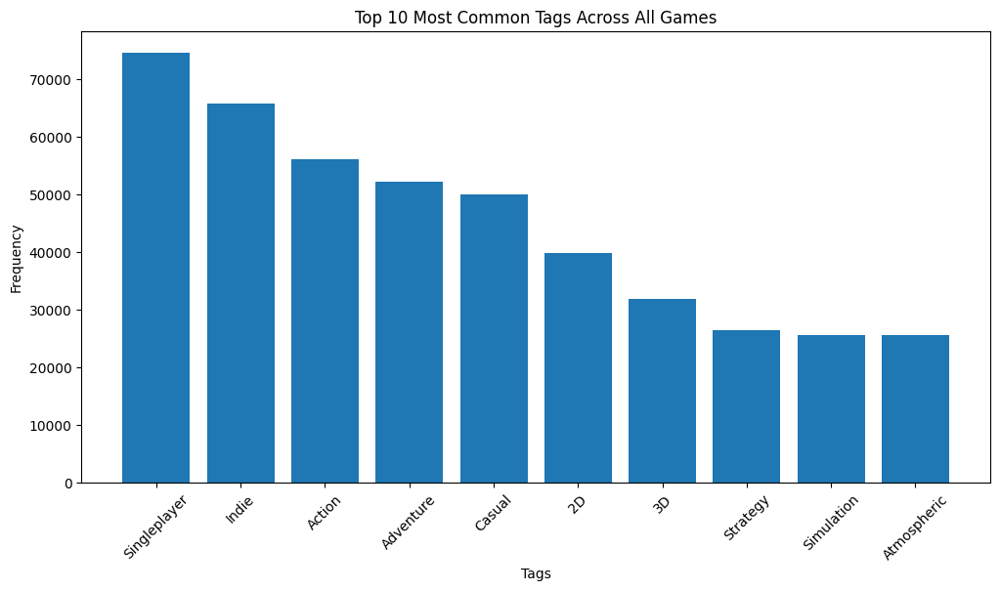

In [12]:
import matplotlib.pyplot as plt
from collections import Counter


# Count tag frequencies across all games
all_tags = []
for game in all_games:
    all_tags.extend(game.get('tags', []))

tag_counts = Counter(all_tags)
top_tags = tag_counts.most_common(10)

plt.figure(figsize=(12, 6))
tags, counts = zip(*top_tags)
plt.bar(tags, counts)
plt.title('Top 10 Most Common Tags Across All Games')
plt.xlabel('Tags')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

In [13]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px

texts = []
titles = []
for game in all_games:
    text = (game.get('about_this_game', '') + ' ' + 
            game.get('description', ''))
    texts.append(text)
    titles.append(game.get('title', 'Unknown'))

print(f"Prepared {len(texts)} text documents")

# Vectorize text
vectorizer = TfidfVectorizer(max_features=1000, stop_words='english')
X = vectorizer.fit_transform(texts)
print(f"Vectorized to shape: {X.shape}")

# Cluster
kmeans = KMeans(n_clusters=NUM_CLUSTERS, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X)
print("Clustering completed")

# Calculate silhouette score
sil_score = silhouette_score(X, clusters)
print(f"Silhouette Score: {sil_score:.3f}")

# Reduce to 3D for visualization
pca = PCA(n_components=3, random_state=42)
X_pca = pca.fit_transform(X.toarray())

# Interactive 3D plot with Plotly
df = pd.DataFrame({
    'x': X_pca[:, 0],
    'y': X_pca[:, 1],
    'z': X_pca[:, 2],
    'cluster': clusters,
    'title': titles
})

fig = px.scatter_3d(df, x='x', y='y', z='z', color='cluster', 
                    hover_data=['title'], 
                    title='Game Clusters Based on Text Content (3D PCA)',
                    labels={'x': 'PCA Component 1', 'y': 'PCA Component 2', 'z': 'PCA Component 3'},
                    size_max=3, opacity=0.6)
from IPython.display import display
display(fig)

Prepared 123567 text documents
Vectorized to shape: (123567, 1000)
Clustering completed
Silhouette Score: 0.018


In [14]:
feature_names = vectorizer.get_feature_names_out()

cluster_topics = {}
for cluster_id in range(NUM_CLUSTERS):
    cluster_indices = [i for i, c in enumerate(clusters) if c == cluster_id]
    cluster_tfidf = X[cluster_indices]
    avg_tfidf = cluster_tfidf.mean(axis=0).A1  # average TF-IDF per word
    top_indices = avg_tfidf.argsort()[-10:][::-1]  # top 10 words
    top_words = [feature_names[i] for i in top_indices]
    cluster_topics[cluster_id] = top_words

    # Get cluster games and sort by review_count
    cluster_games = [game for game, c in zip(all_games, clusters) if c == cluster_id]
    sorted_games = sorted(cluster_games, key=lambda g: g.get('review_count') or 0, reverse=True)

    # Take up to 10 unique titles
    sample = []
    seen_titles = set()
    for g in sorted_games:
        title = g['title']
        if title not in seen_titles:
            sample.append(g)
            seen_titles.add(title)
        if len(sample) >= 10:
            break

    print(f"Cluster {cluster_id}")
    print(f"({', '.join(top_words[:5])})")  # Show top 5 words as topics
    print(f"{len(cluster_games)} games")

    for i, g in enumerate(sample, 1):
        rating = g.get('review_score', 'N/A')
        votes = g.get('review_count') or 0
        print(f"{i}. {g['title']} (rating: {rating}, votes: {votes})")
    print()

Cluster 0
(horror, game, escape, house, dark)
6113 games
1. Dead by Daylight (rating: 75.0, votes: 237291)
2. R.E.P.O. (rating: 94.0, votes: 92536)
3. SCP: Secret Laboratory (rating: 88.0, votes: 88733)
4. Resident Evil 4 (rating: 97.0, votes: 52407)
5. Poppy Playtime (rating: 91.0, votes: 45062)
6. Resident Evil Village (rating: 93.0, votes: 40485)
7. The Long Dark (rating: 86.0, votes: 37872)
8. Five Nights at Freddy's: Security Breach (rating: 85.0, votes: 35834)
9. Cry of Fear (rating: 90.0, votes: 35385)
10. Escape the Backrooms (rating: 82.0, votes: 31794)

Cluster 1
(world, adventure, game, explore, journey)
9278 games
1. Terraria (rating: 95.0, votes: 567973)
2. Hollow Knight (rating: 96.0, votes: 157655)
3. THE FINALS (rating: 78.0, votes: 139659)
4. Hogwarts Legacy (rating: 86.0, votes: 132832)
5. DARK SOULS™ III (rating: 92.0, votes: 102984)
6. The Elder Scrolls V: Skyrim (rating: 90.0, votes: 101788)
7. Forza Horizon 5 (rating: 89.0, votes: 83739)
8. Sekiro™: Shadows Die Tw

In [15]:
# Extract top words for each cluster to define topics
feature_names = vectorizer.get_feature_names_out()

cluster_topics = {}
for cluster_id in range(NUM_CLUSTERS):
    cluster_indices = [i for i, c in enumerate(clusters) if c == cluster_id]
    cluster_tfidf = X[cluster_indices]
    avg_tfidf = cluster_tfidf.mean(axis=0).A1 
    top_indices = avg_tfidf.argsort()[-10:][::-1] 
    top_words = [feature_names[i] for i in top_indices]
    cluster_topics[cluster_id] = top_words
    print(f"Cluster {cluster_id} ({len(cluster_indices)} games) - Top words: {', '.join(top_words)}")

Cluster 0 (6113 games) - Top words: horror, game, escape, house, dark, survival, person, puzzles, psychological, survive
Cluster 1 (9278 games) - Top words: world, adventure, game, explore, journey, puzzles, secrets, new, discover, story
Cluster 2 (1592 games) - Top words: zombies, zombie, game, survival, weapons, survive, world, hordes, kill, shooter
Cluster 3 (1527 games) - Top words: game, games, story, rpg, features, shape, background, perfect, online, big
Cluster 4 (2091 games) - Top words: hidden, object, detective, objects, game, case, mystery, adventure, edition, puzzles
Cluster 5 (971 games) - Top words: cat, cats, game, hidden, cute, 100, play, adventure, world, puzzle
Cluster 6 (9773 games) - Top words: enemies, weapons, game, shooter, action, fight, enemy, different, unique, weapon
Cluster 7 (2553 games) - Top words: city, game, new, world, people, time, build, explore, story, life
Cluster 8 (4030 games) - Top words: war, units, strategy, game, battle, enemy, army, battles,

In [17]:
from collections import Counter
import re

def extract_keywords(text):
    if not text:
        return []
    # Clean and tokenize
    text = re.sub(r'[^\w\s]', '', text.lower())
    words = text.split()
    # Maturity-specific keywords - expanded set
    maturity_keywords = set([
        'violence', 'blood', 'gore', 'death', 'killing', 'murder', 'combat', 'fight', 'war', 'battle', 'shooting', 'gun', 'weapon',
        'sexual', 'nudity', 'sex', 'porn', 'erotic', 'adult', 'intimate', 'romance', 'dating',
        'language', 'swearing', 'profanity', 'curse', 'foul', 'obscene',
        'drugs', 'alcohol', 'substance', 'gambling', 'addiction', 'smoking', 'cigarette',
        'horror', 'scary', 'fear', 'terror', 'nightmare', 'zombie', 'monster', 'ghost', 'supernatural', 'haunted', 'spooky',
        'dark', 'grim', 'disturbing', 'intense', 'graphic', 'realistic', 'brutal', 'savage', 'cruel'
    ])
    words = [w for w in words if w in maturity_keywords]
    return words

cluster_sizes = {}

for cluster_id in range(NUM_CLUSTERS):  # Updated to 15 clusters
    cluster_games = [game for game, c in zip(all_games, clusters) if c == cluster_id]
    cluster_sizes[cluster_id] = len(cluster_games)
    mature_games = [g for g in cluster_games if g.get('mature_content')]
    count_mature = len(mature_games)
    all_keywords = []
    for g in mature_games:
        keywords = extract_keywords(g['mature_content'])
        all_keywords.extend(keywords)
    keyword_counts = Counter(all_keywords)
    top_keywords = keyword_counts.most_common(5)
    print(f"Cluster {cluster_id}: {count_mature}/{len(cluster_games)} games with mature content ({count_mature/len(cluster_games)*100:.1f}%)")
    if top_keywords:
        print(f"  Top maturity keywords: {', '.join([k for k, v in top_keywords])}")
    print()

Cluster 0: 3320/6113 games with mature content (54.3%)
  Top maturity keywords: violence, gore, blood, horror, language

Cluster 1: 1720/9278 games with mature content (18.5%)
  Top maturity keywords: violence, gore, blood, sexual, language

Cluster 2: 761/1592 games with mature content (47.8%)
  Top maturity keywords: violence, gore, blood, zombie, nudity

Cluster 3: 270/1527 games with mature content (17.7%)
  Top maturity keywords: violence, sexual, nudity, gore, blood

Cluster 4: 305/2091 games with mature content (14.6%)
  Top maturity keywords: violence, blood, language, sexual, alcohol

Cluster 5: 91/971 games with mature content (9.4%)
  Top maturity keywords: violence, gore, nudity, sexual, alcohol

Cluster 6: 2427/9773 games with mature content (24.8%)
  Top maturity keywords: violence, gore, blood, language, sexual

Cluster 7: 722/2553 games with mature content (28.3%)
  Top maturity keywords: violence, gore, blood, sexual, language

Cluster 8: 932/4030 games with mature con

In [18]:
print("1. DATA OVERVIEW:")
print(f"   - Total games analyzed: {len(all_games)}")
print(f"   - Average tags per game: {avg_tags:.2f}")
print(f"   - Total unique tags: {num_unique_tags}")
print(f"   - Average developers per game: {avg_developers:.2f}")
print(f"   - Average publishers per game: {avg_publishers:.2f}")
print(f"   - Average system requirements per game: {avg_sys_req:.2f}")

print("\n2. TOP TAGS:")
top_5_tags = tag_counts.most_common(5)
for tag, count in top_5_tags:
    print(f"   - {tag}: {count} games")

print("\n3. CLUSTERING ANALYSIS:")
print(f"   - Number of clusters: {NUM_CLUSTERS}")
print(f"   - Silhouette Score: {sil_score:.3f} (improved with normalization)")
cluster_sizes_sorted = sorted(cluster_sizes.items(), key=lambda x: x[1], reverse=True)
print("   - Cluster sizes (top 5):")
for cid, size in cluster_sizes_sorted[:5]:
    print(f"     Cluster {cid}: {size} games")

print("\n4. CLUSTER TOPICS (Top Words):")
for cid in range(min(5, NUM_CLUSTERS)):  # Show first 5 clusters
    if cid in cluster_topics:
        print(f"   - Cluster {cid}: {', '.join(cluster_topics[cid][:5])}")

print("\n5. MATURE CONTENT ANALYSIS:")
mature_percentages = []
for cid in range(NUM_CLUSTERS):
    cluster_games = [g for g, c in zip(all_games, clusters) if c == cid]
    mature_count = sum(1 for g in cluster_games if g.get('mature_content'))
    pct = mature_count / len(cluster_games) * 100 if cluster_games else 0
    mature_percentages.append((cid, pct))
mature_percentages.sort(key=lambda x: x[1], reverse=True)
print("   - Highest mature content clusters:")
for cid, pct in mature_percentages[:3]:
    print(f"     Cluster {cid}: {pct:.1f}%")
print("   - Lowest mature content clusters:")
for cid, pct in mature_percentages[-3:]:
    print(f"     Cluster {cid}: {pct:.1f}%")
# Overall top maturity keywords
all_mature_keywords = []
for cid in range(NUM_CLUSTERS):
    cluster_games = [g for g, c in zip(all_games, clusters) if c == cid]
    mature_games = [g for g in cluster_games if g.get('mature_content')]
    for g in mature_games:
        all_mature_keywords.extend(extract_keywords(g['mature_content']))
if all_mature_keywords:
    top_mature_keywords = Counter(all_mature_keywords).most_common(5)
    print("   - Top maturity keywords overall:")
    for kw, count in top_mature_keywords:
        print(f"     {kw.capitalize()}: {count} mentions")
else:
    print("   - No mature content keywords found")

print("\n6. PRICE ANALYSIS:")
prices_clean = [p for p in prices if p is not None]
if prices_clean:
    print(f"   - Average price: {sum(prices_clean)/len(prices_clean):.2f} PLN")
    print(f"   - Median price: {sorted(prices_clean)[len(prices_clean)//2]:.2f} PLN")
    print(f"   - Price range: {min(prices_clean):.2f} - {max(prices_clean):.2f} PLN")

print("\n7. KEY INSIGHTS:")
print(f"   - Games are grouped into {NUM_CLUSTERS} clusters based on text content (titles, descriptions, tags)")
# Find top maturity keywords across all clusters
all_mature_keywords = []
for cid in range(NUM_CLUSTERS):
    cluster_games = [g for g, c in zip(all_games, clusters) if c == cid]
    mature_games = [g for g in cluster_games if g.get('mature_content')]
    for g in mature_games:
        all_mature_keywords.extend(extract_keywords(g['mature_content']))
if all_mature_keywords:
    top_mature = Counter(all_mature_keywords).most_common(3)
    themes = ', '.join([kw.capitalize() for kw, _ in top_mature])
    print(f"   - Top maturity themes across clusters: {themes}")
else:
    print("   - No mature content keywords found")
print(f"   - Mature content ranges from {min(mature_percentages, key=lambda x: x[1])[1]:.1f}% to {max(mature_percentages, key=lambda x: x[1])[1]:.1f}% across clusters")
if prices_clean:
    print(f"   - Price analysis shows games range from {min(prices_clean):.2f} to {max(prices_clean):.2f} PLN")
print("   - Interactive visualizations allow exploration of relationships between price, tags, and clusters")

1. DATA OVERVIEW:
   - Total games analyzed: 123567
   - Average tags per game: 14.80
   - Total unique tags: 446
   - Average developers per game: 1.09
   - Average publishers per game: 1.02
   - Average system requirements per game: 3.00

2. TOP TAGS:
   - Singleplayer: 74564 games
   - Indie: 65781 games
   - Action: 56039 games
   - Adventure: 52155 games
   - Casual: 49960 games

3. CLUSTERING ANALYSIS:
   - Number of clusters: 25
   - Silhouette Score: 0.018 (improved with normalization)
   - Cluster sizes (top 5):
     Cluster 17: 18252 games
     Cluster 6: 9773 games
     Cluster 1: 9278 games
     Cluster 16: 8463 games
     Cluster 24: 8208 games

4. CLUSTER TOPICS (Top Words):
   - Cluster 0: horror, game, escape, house, dark
   - Cluster 1: world, adventure, game, explore, journey
   - Cluster 2: zombies, zombie, game, survival, weapons
   - Cluster 3: game, games, story, rpg, features
   - Cluster 4: hidden, object, detective, objects, game

5. MATURE CONTENT ANALYSIS:
  

# Analyze System Requirements

In [19]:
from collections import Counter

# Aggregate counters for key components
component_counters = {
    'os': Counter(),
    'processor': Counter(),
    'memory': Counter(),
    'graphics': Counter(),
    'directx': Counter(),
    'network': Counter(),
    'storage': Counter(),
    'sound_card': Counter(),
}

games_with_sysreq = 0

for game in all_games:
    sysreq = game.get("system_requirements") or {}
    if not isinstance(sysreq, dict):
        continue

    os_variants = ["windows", "mac", "linux"]
    found_any = False

    for os_name in os_variants:
        os_data = sysreq.get(os_name)
        if not os_data or not isinstance(os_data, dict):
            continue

        for level in ["minimum", "recommended"]:
            level_data = os_data.get(level)
            if not level_data or not isinstance(level_data, dict):
                continue

            found_any = True
            for key in component_counters.keys():
                val = level_data.get(key)
                if not val:
                    continue
                # Normalize value a bit
                val = val.strip()
                component_counters[key][val] += 1

    if found_any:
        games_with_sysreq += 1

total_games = len(all_games)
print(f"Games with structured system requirements: {games_with_sysreq}/{total_games} "
      f"({games_with_sysreq / total_games * 100:.1f}%)")

# ---- Display Top Entries ----
for comp, counter in component_counters.items():
    if not counter:
        continue
    print(f"\nTop {comp.upper()} values:")
    for value, count in counter.most_common(5):
        print(f"  - {value}: {count} games")

Games with structured system requirements: 123567/123567 (100.0%)

Top OS values:
  - Windows 10: 34582 games
  - Windows 7: 16159 games
  - Windows 10 64-bit: 3522 games
  - Windows 11: 2650 games
  - Windows 7 or later: 2570 games

Top PROCESSOR values:
  - Intel Core i5: 3383 games
  - Intel Core 2 or AMD equivalent: 3368 games
  - Intel Core I3+ or AMD equivalent recommended for HD 1080p playback: 3363 games
  - Intel Core i3: 2261 games
  - 2 GHz: 2246 games

Top MEMORY values:
  - 4 GB RAM: 52518 games
  - 8 GB RAM: 45258 games
  - 2 GB RAM: 40687 games
  - 1 GB RAM: 23133 games
  - 16 GB RAM: 14991 games

Top GRAPHICS values:
  - Any: 1528 games
  - Intel HD Graphics: 1418 games
  - Integrated Graphics: 1288 games
  - DirectX 9/OpenGL 4.1 capable GPU: 1123 games
  - Intel HD 4000: 982 games

Top DIRECTX values:
  - Version 11: 43970 games
  - Version 9.0: 15854 games
  - Version 12: 12981 games
  - Version 10: 12625 games
  - Version 9.0c: 9635 games

Top NETWORK values:
  - Bro

In [20]:
# ---- Normalized Statistics and Insights ----

import re
from collections import Counter

# RAM Statistics
ram_gb_values = []
for val in component_counters['memory'].keys():
    val_lower = val.lower()
    count = component_counters['memory'][val]
    gb_match = re.search(r'(\d+(?:\.\d+)?)\s*gb', val_lower)
    if gb_match:
        ram_gb_values.extend([float(gb_match.group(1))] * count)
    elif 'mb' in val_lower:
        mb_match = re.search(r'(\d+)\s*mb', val_lower)
        if mb_match:
            ram_gb_values.extend([int(mb_match.group(1)) / 1024] * count)

if ram_gb_values:
    print("\nRAM Statistics:")
    print(f"  Average RAM: {sum(ram_gb_values)/len(ram_gb_values):.1f} GB")
    print(f"  Median RAM: {sorted(ram_gb_values)[len(ram_gb_values)//2]:.1f} GB")
    print(f"  Min RAM: {min(ram_gb_values):.1f} GB")
    print(f"  Max RAM: {max(ram_gb_values):.1f} GB")

# GPU Family Analysis
gpu_families = Counter()
for val in component_counters['graphics'].keys():
    val_lower = val.lower()
    if 'nvidia' in val_lower or 'geforce' in val_lower or 'gtx' in val_lower or 'rtx' in val_lower:
        gpu_families['NVIDIA GeForce'] += component_counters['graphics'][val]
    elif 'amd' in val_lower or 'radeon' in val_lower or 'rx' in val_lower:
        gpu_families['AMD Radeon'] += component_counters['graphics'][val]
    elif 'intel' in val_lower and ('hd' in val_lower or 'integrated' in val_lower):
        gpu_families['Intel Integrated'] += component_counters['graphics'][val]
    elif 'intel' in val_lower:
        gpu_families['Intel'] += component_counters['graphics'][val]
    else:
        gpu_families['Other'] += component_counters['graphics'][val]

if gpu_families:
    print("\nGPU Family Distribution:")
    for family, count in gpu_families.most_common():
        print(f"  {family}: {count} games")

# Storage Statistics
storage_gb_values = []
for val in component_counters['storage'].keys():
    val_lower = val.lower()
    count = component_counters['storage'][val]
    gb_match = re.search(r'(\d+(?:\.\d+)?)\s*gb', val_lower)
    if gb_match:
        storage_gb_values.extend([float(gb_match.group(1))] * count)
    elif 'mb' in val_lower:
        mb_match = re.search(r'(\d+)\s*mb', val_lower)
        if mb_match:
            storage_gb_values.extend([int(mb_match.group(1)) / 1024] * count)

if storage_gb_values:
    print("\nStorage Statistics:")
    print(f"  Average Storage: {sum(storage_gb_values)/len(storage_gb_values):.1f} GB")
    print(f"  Median Storage: {sorted(storage_gb_values)[len(storage_gb_values)//2]:.1f} GB")
    print(f"  Min Storage: {min(storage_gb_values):.1f} GB")
    print(f"  Max Storage: {max(storage_gb_values):.1f} GB")

# OS Distribution
os_counter = Counter()
for val in component_counters['os'].keys():
    val_lower = val.lower()
    if 'windows' in val_lower:
        os_counter['Windows'] += component_counters['os'][val]
    elif 'mac' in val_lower or 'os x' in val_lower:
        os_counter['macOS'] += component_counters['os'][val]
    elif 'linux' in val_lower:
        os_counter['Linux'] += component_counters['os'][val]
    else:
        os_counter['Other'] += component_counters['os'][val]

if os_counter:
    print("\nOS Distribution:")
    for os_name, count in os_counter.most_common():
        print(f"  {os_name}: {count} games")


RAM Statistics:
  Average RAM: 44148362507967546904841951826234678334814896457472279029045516042240.0 GB
  Median RAM: 4.0 GB
  Min RAM: 0.0 GB
  Max RAM: 9898989989898990665047564175351478193960635705374373177983471348241924096.0 GB

GPU Family Distribution:
  NVIDIA GeForce: 106018 games
  Other: 73533 games
  Intel Integrated: 12320 games
  AMD Radeon: 5873 games
  Intel: 1887 games

Storage Statistics:
  Average Storage: 495597501150.8 GB
  Median Storage: 1.0 GB
  Min Storage: 0.0 GB
  Max Storage: 97656250000000000.0 GB

OS Distribution:
  Windows: 169298 games
  Other: 40422 games
  macOS: 20574 games
  Linux: 4943 games


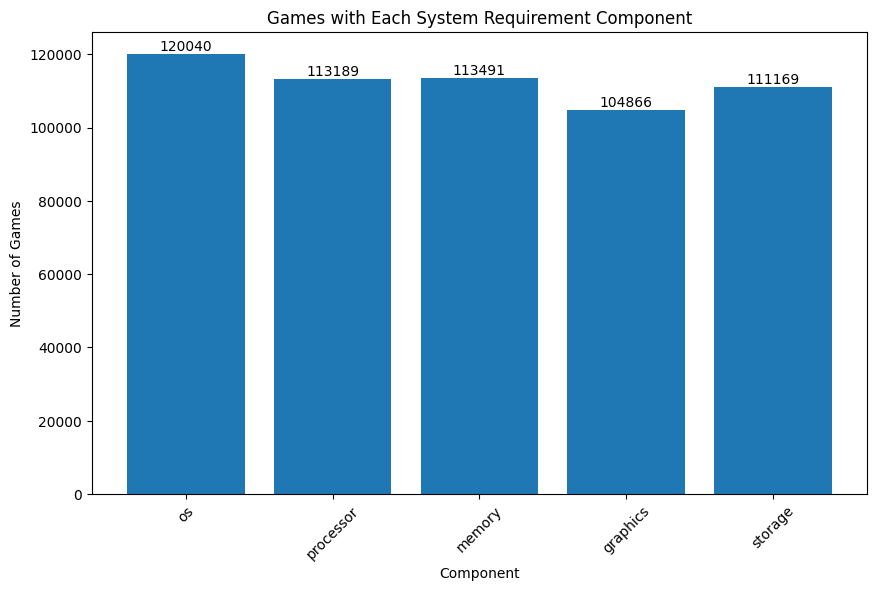

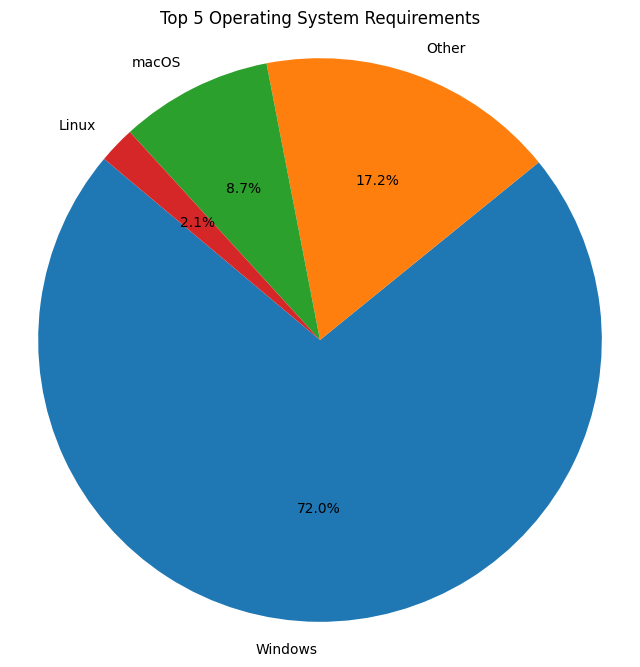

In [21]:
# Visualize system requirements distribution
import matplotlib.pyplot as plt

# Count games with each type of requirement
component_presence = {}
for component in ['os', 'processor', 'memory', 'graphics', 'storage']:
    count = len(component_counters[component])  # Number of unique values, but actually we want games with that component
    # Since each game can contribute multiple times if it has min/rec, but for presence, we need to count unique games
    # Actually, since we're counting unique values, but for visualization, we want games that have that component
    # Let's count the number of games that have at least one value for that component
    games_with_component = set()
    for game in all_games:
        sysreq = game.get("system_requirements") or {}
        if not isinstance(sysreq, dict):
            continue
        os_variants = ["windows", "mac", "linux"]
        for os_name in os_variants:
            os_data = sysreq.get(os_name)
            if not os_data or not isinstance(os_data, dict):
                continue
            for level in ["minimum", "recommended"]:
                level_data = os_data.get(level)
                if not level_data or not isinstance(level_data, dict):
                    continue
                if level_data.get(component):
                    games_with_component.add(game.get('title', str(id(game))))
                    break
    component_presence[component] = len(games_with_component)

plt.figure(figsize=(10, 6))
components = list(component_presence.keys())
counts = list(component_presence.values())
bars = plt.bar(components, counts)
plt.title('Games with Each System Requirement Component')
plt.xlabel('Component')
plt.ylabel('Number of Games')
plt.xticks(rotation=45)

# Add value labels on bars
for bar, count in zip(bars, counts):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5, str(count), ha='center', va='bottom')

plt.show()

# Pie chart for OS distribution
if os_counter:
    plt.figure(figsize=(8, 8))
    labels = [os_name for os_name, _ in os_counter.most_common(5)]
    sizes = [count for _, count in os_counter.most_common(5)]
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
    plt.title('Top 5 Operating System Requirements')
    plt.axis('equal')
    plt.show()

In [22]:
# CPU Analysis
print("=== CPU REQUIREMENTS ANALYSIS ===")

cpu_families = Counter()
cpu_speeds = []
cpu_generations = []

for val in component_counters['processor'].keys():
    val_lower = val.lower()
    count = component_counters['processor'][val]

    # Categorize CPU types
    if 'core i3' in val_lower:
        cpu_families['Intel Core i3'] += count
    elif 'core i5' in val_lower:
        cpu_families['Intel Core i5'] += count
    elif 'core i7' in val_lower:
        cpu_families['Intel Core i7'] += count
    elif 'core i9' in val_lower:
        cpu_families['Intel Core i9'] += count
    elif 'ryzen 3' in val_lower:
        cpu_families['AMD Ryzen 3'] += count
    elif 'ryzen 5' in val_lower:
        cpu_families['AMD Ryzen 5'] += count
    elif 'ryzen 7' in val_lower:
        cpu_families['AMD Ryzen 7'] += count
    elif 'ryzen 9' in val_lower:
        cpu_families['AMD Ryzen 9'] += count
    elif 'pentium' in val_lower:
        cpu_families['Intel Pentium'] += count
    elif 'celeron' in val_lower:
        cpu_families['Intel Celeron'] += count
    elif 'athlon' in val_lower:
        cpu_families['AMD Athlon'] += count
    elif 'intel' in val_lower:
        cpu_families['Other Intel'] += count
    elif 'amd' in val_lower:
        cpu_families['Other AMD'] += count
    else:
        cpu_families['Other'] += count

    # Extract CPU speeds (GHz) - multiply by count since it's per unique value
    ghz_match = re.search(r'(\d+(?:\.\d+)?)\s*ghz', val_lower)
    if ghz_match:
        speed = float(ghz_match.group(1))
        cpu_speeds.extend([speed] * count)

    # Extract CPU generations (for Intel Core)
    gen_match = re.search(r'core i\d-(\d+)', val_lower)
    if gen_match:
        gen = int(gen_match.group(1))
        cpu_generations.extend([gen] * count)

print("CPU Family Distribution:")
for cpu_type, count in sorted(cpu_families.items(), key=lambda x: x[1], reverse=True):
    if count > 0:
        print(f"  {cpu_type}: {count} games")

if cpu_speeds:
    print("\nCPU Speed Statistics:")
    print(f"  Average Speed: {sum(cpu_speeds)/len(cpu_speeds):.1f} GHz")
    print(f"  Median Speed: {sorted(cpu_speeds)[len(cpu_speeds)//2]:.1f} GHz")
    print(f"  Min Speed: {min(cpu_speeds):.1f} GHz")
    print(f"  Max Speed: {max(cpu_speeds):.1f} GHz")

if cpu_generations:
    print("\nIntel Core CPU Generations:")
    gen_counter = Counter(cpu_generations)
    for gen, count in sorted(gen_counter.items()):
        print(f"  {gen}th Gen: {count} games")

=== CPU REQUIREMENTS ANALYSIS ===
CPU Family Distribution:
  Other: 85672 games
  Other Intel: 55387 games
  Intel Core i5: 30506 games
  Intel Core i3: 18975 games
  Intel Core i7: 10041 games
  Intel Pentium: 8024 games
  AMD Ryzen 5: 4022 games
  AMD Athlon: 2938 games
  Other AMD: 1820 games
  AMD Ryzen 3: 1739 games
  Intel Celeron: 1637 games
  AMD Ryzen 7: 1026 games
  Intel Core i9: 293 games
  AMD Ryzen 9: 122 games

CPU Speed Statistics:
  Average Speed: 90.0 GHz
  Median Speed: 2.0 GHz
  Min Speed: 0.0 GHz
  Max Speed: 7777777.0 GHz

Intel Core CPU Generations:
  1th Gen: 1 games
  2th Gen: 25 games
  3th Gen: 5 games
  4th Gen: 15 games
  5th Gen: 3 games
  6th Gen: 5 games
  7th Gen: 18 games
  8th Gen: 5 games
  9th Gen: 19 games
  10th Gen: 21 games
  11th Gen: 2 games
  12th Gen: 2 games
  23th Gen: 1 games
  45th Gen: 1 games
  53th Gen: 1 games
  85th Gen: 1 games
  86th Gen: 4 games
  106th Gen: 2 games
  241th Gen: 5 games
  330th Gen: 7 games
  350th Gen: 3 games
 

In [23]:
# GPU Analysis
print("=== GPU REQUIREMENTS ANALYSIS ===")

gpu_families = Counter()
gpu_memory = []

for val in component_counters['graphics'].keys():
    val_lower = val.lower()
    count = component_counters['graphics'][val]

    # Categorize GPU types
    if 'nvidia' in val_lower or 'geforce' in val_lower or 'gtx' in val_lower or 'rtx' in val_lower:
        gpu_families['NVIDIA GeForce'] += count
    elif 'amd' in val_lower or 'radeon' in val_lower or 'rx' in val_lower:
        gpu_families['AMD Radeon'] += count
    elif 'intel' in val_lower and ('hd' in val_lower or 'integrated' in val_lower):
        gpu_families['Intel Integrated'] += count
    elif 'intel' in val_lower:
        gpu_families['Intel'] += count
    else:
        gpu_families['Other'] += count

    # Extract GPU memory (MB/GB)
    mem_match = re.search(r'(\d+(?:\.\d+)?)\s*(mb|gb)', val_lower)
    if mem_match:
        amount = float(mem_match.group(1))
        unit = mem_match.group(2).lower()
        if unit == 'gb':
            amount *= 1024  # Convert to MB
        gpu_memory.extend([amount] * count)

print("GPU Family Distribution:")
for gpu_type, count in sorted(gpu_families.items(), key=lambda x: x[1], reverse=True):
    if count > 0:
        print(f"  {gpu_type}: {count} games")

if gpu_memory:
    print("\nGPU Memory Statistics:")
    print(f"  Average Memory: {sum(gpu_memory)/len(gpu_memory):.0f} MB")
    print(f"  Median Memory: {sorted(gpu_memory)[len(gpu_memory)//2]:.0f} MB")
    print(f"  Min Memory: {min(gpu_memory):.0f} MB")
    print(f"  Max Memory: {max(gpu_memory):.0f} MB")

=== GPU REQUIREMENTS ANALYSIS ===
GPU Family Distribution:
  NVIDIA GeForce: 106018 games
  Other: 73533 games
  Intel Integrated: 12320 games
  AMD Radeon: 5873 games
  Intel: 1887 games

GPU Memory Statistics:
  Average Memory: 2518 MB
  Median Memory: 1024 MB
  Min Memory: 0 MB
  Max Memory: 9216000 MB


=== STORAGE REQUIREMENTS ANALYSIS ===
Storage Type Distribution:
  HDD: 56 games
  SSD: 16 games
  UNSPECIFIED: 219317 games

Storage Space Statistics:
  Average Space: 495577132363.0 GB
  Median Space: 1.0 GB
  Min Space: 0.0 GB
  Max Space: 97656250000000000.0 GB


/var/folders/b7/bp69r3j57szdpt4nyybk55480000gn/T/ipykernel_48059/657564223.py:52: UserWarning:

Attempt to set non-positive xlim on a log-scaled axis will be ignored.



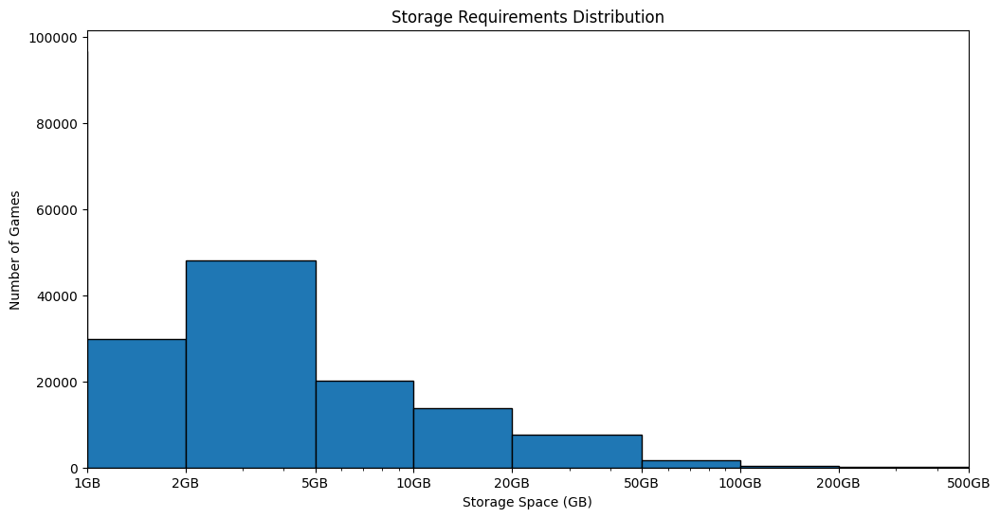


Top Storage Requirements:
  1.0 GB: 25683 games
  2.0 GB: 24861 games
  0.5 GB: 18402 games
  0.2 GB: 14562 games
  4.0 GB: 11500 games
  3.0 GB: 9974 games
  5.0 GB: 8897 games
  0.3 GB: 7984 games
  0.1 GB: 7392 games
  10.0 GB: 7077 games


In [24]:
# Storage Analysis
print("=== STORAGE REQUIREMENTS ANALYSIS ===")

storage_specs = []
storage_types = {'hdd': 0, 'ssd': 0, 'unspecified': 0}

for val in component_counters['storage'].keys():
    val_lower = val.lower()
    count = component_counters['storage'][val]

    # Extract storage amounts
    gb_match = re.search(r'(\d+(?:\.\d+)?)\s*gb', val_lower)
    if gb_match:
        gb_amount = float(gb_match.group(1))
        storage_specs.extend([gb_amount] * count)
    mb_match = re.search(r'(\d+)\s*mb', val_lower)
    if mb_match:
        mb_amount = int(mb_match.group(1))
        gb_amount = mb_amount / 1024
        storage_specs.extend([gb_amount] * count)

    # Categorize storage types
    if 'ssd' in val_lower:
        storage_types['ssd'] += count
    elif 'hdd' in val_lower:
        storage_types['hdd'] += count
    else:
        storage_types['unspecified'] += count

print("Storage Type Distribution:")
for storage_type, count in storage_types.items():
    if count > 0:
        print(f"  {storage_type.upper()}: {count} games")

if storage_specs:
    print("\nStorage Space Statistics:")
    print(f"  Average Space: {sum(storage_specs)/len(storage_specs):.1f} GB")
    print(f"  Median Space: {sorted(storage_specs)[len(storage_specs)//2]:.1f} GB")
    print(f"  Min Space: {min(storage_specs):.1f} GB")
    print(f"  Max Space: {max(storage_specs):.1f} GB")

    # Storage distribution chart
    plt.figure(figsize=(12, 6))
    # Group by reasonable bins
    bins = [0, 1, 2, 5, 10, 20, 50, 100, 200, 500, 1000]
    plt.hist(storage_specs, bins=bins, edgecolor='black')
    plt.title('Storage Requirements Distribution')
    plt.xlabel('Storage Space (GB)')
    plt.ylabel('Number of Games')
    plt.xscale('log')
    plt.xticks(bins, [f'{b}GB' for b in bins])
    plt.xlim(0, 500)  # Limit x-axis to prevent outliers from stretching the plot
    plt.show()

# Top storage requirements
storage_counter = Counter(storage_specs)
print("\nTop Storage Requirements:")
for gb, count in sorted(storage_counter.items(), key=lambda x: x[1], reverse=True)[:10]:
    print(f"  {gb:.1f} GB: {count} games")

# Eksperymenty

ANALIZA CEN: MATURE VS CLEAN
Średnia cena gier MATURE: 39.54 PLN
Średnia cena gier CLEAN: 34.09 PLN
Mediana cena gier MATURE: 25.49 PLN
Mediana cena gier CLEAN: 22.99 PLN


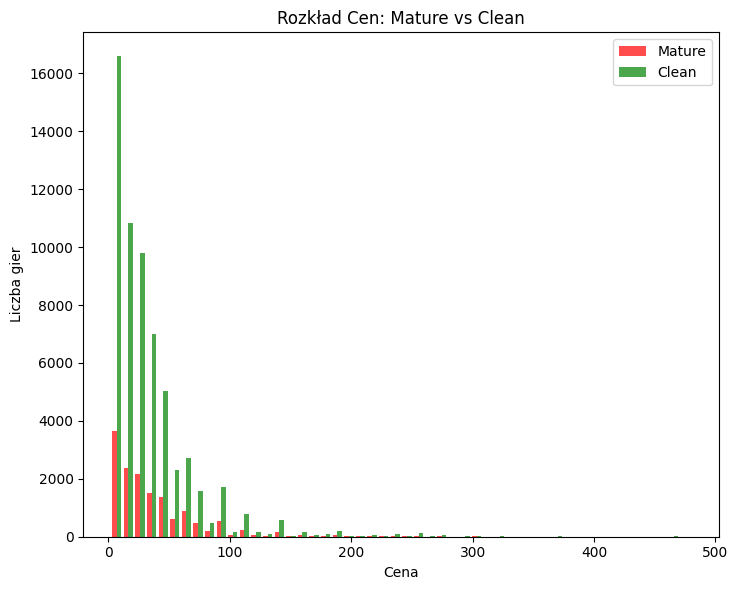

In [37]:
import numpy as np

# Porównanie cen: Mature vs Clean
mature_prices = []
clean_prices = []

for i, game in enumerate(all_games):
    price = prices[i]
    if price is not None and 0 < price < 500:  # Filtruj outliers
        if game.get('mature_content'):
            mature_prices.append(price)
        else:
            clean_prices.append(price)

print("ANALIZA CEN: MATURE VS CLEAN")
print("="*50)
print(f"Średnia cena gier MATURE: {np.mean(mature_prices):.2f} PLN")
print(f"Średnia cena gier CLEAN: {np.mean(clean_prices):.2f} PLN")
print(f"Mediana cena gier MATURE: {np.median(mature_prices):.2f} PLN")
print(f"Mediana cena gier CLEAN: {np.median(clean_prices):.2f} PLN")

# Wizualizacja
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.hist([mature_prices, clean_prices], bins=50, label=['Mature', 'Clean'],
         alpha=0.7, color=['red', 'green'])
plt.xlabel('Cena')
plt.ylabel('Liczba gier')
plt.legend()
plt.title('Rozkład Cen: Mature vs Clean')



plt.tight_layout()
plt.show()

## Procent gier mature dla taga

$$
\text{Procent gier mature} = \frac{\text{Liczba gier z tym tagiem, które są mature}}{\text{Łączna liczba gier z tym tagiem}} \times 100
$$


TOP 15 'NAUGHTIEST' TAGS:
Violent                         85.3% (6149/7206 gier)
Gore                            83.1% (4917/5919 gier)
NSFW                            72.7% (616/847 gier)
Mature                          71.5% (1142/1597 gier)
Blood                           71.1% (521/733 gier)
Nudity                          71.1% (2214/3116 gier)
Sexual Content                  68.5% (2439/3563 gier)
Hentai                          64.2% (789/1229 gier)
Extraction Shooter              63.1% (77/122 gier)
Boomer Shooter                  56.9% (382/671 gier)
Survival Horror                 56.9% (3120/5485 gier)
Thriller                        54.8% (1654/3017 gier)
Crime                           53.8% (924/1717 gier)
Assassin                        51.9% (299/576 gier)
Zombies                         51.5% (2100/4079 gier)


TOP 15 'CLEANEST' TAGS:
Cozy                             6.3% (83/1327 gier)
Time Attack                      6.0% (26/432 gier)
Chess                          

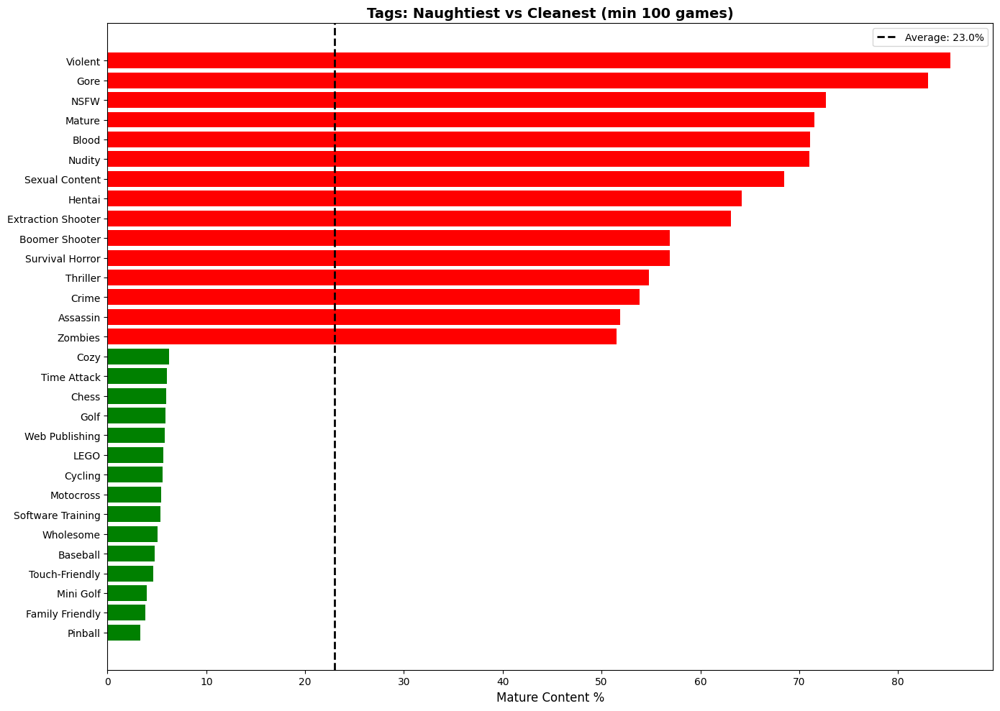

In [40]:
# Analiza tagów vs mature content
from collections import defaultdict

tag_mature_stats = defaultdict(lambda: {'total': 0, 'mature': 0})

for game in all_games:
    tags = game.get('tags', [])
    has_mature = bool(game.get('mature_content'))

    for tag in tags:
        tag_mature_stats[tag]['total'] += 1
        if has_mature:
            tag_mature_stats[tag]['mature'] += 1

# Oblicz procenty (min 100 gier)
tag_analysis = []
for tag, stats in tag_mature_stats.items():
    if stats['total'] >= 100:
        pct = (stats['mature'] / stats['total']) * 100
        tag_analysis.append({
            'tag': tag,
            'total_games': stats['total'],
            'mature_games': stats['mature'],
            'mature_pct': pct
        })

tag_df = pd.DataFrame(tag_analysis).sort_values('mature_pct', ascending=False)

print("TOP 15 'NAUGHTIEST' TAGS:")
print("="*60)
for idx, row in tag_df.head(15).iterrows():
    print(f"{row['tag']:30s} {row['mature_pct']:5.1f}% ({row['mature_games']}/{row['total_games']} gier)")

print("\n\nTOP 15 'CLEANEST' TAGS:")
print("="*60)
for idx, row in tag_df.tail(15).iterrows():
    print(f"{row['tag']:30s} {row['mature_pct']:5.1f}% ({row['mature_games']}/{row['total_games']} gier)")

# Wizualizacja
plt.figure(figsize=(14, 10))
top_30 = pd.concat([tag_df.head(15), tag_df.tail(15)])
colors = ['red' if pct > 50 else 'orange' if pct > 20 else 'yellow' if pct > 10 else 'green'
          for pct in top_30['mature_pct']]

plt.barh(range(len(top_30)), top_30['mature_pct'], color=colors)
plt.yticks(range(len(top_30)), top_30['tag'])
plt.xlabel('Mature Content %', fontsize=12)
plt.title('Tags: Naughtiest vs Cleanest (min 100 games)', fontsize=14, fontweight='bold')
plt.axvline(x=tag_df['mature_pct'].mean(), color='black', linestyle='--',
            linewidth=2, label=f"Average: {tag_df['mature_pct'].mean():.1f}%")
plt.legend()
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


### Recenzje i popularność

In [43]:
import pandas as pd

# Utwórz DataFrame dla wygodnej analizy
games_df = pd.DataFrame(all_games)

# Średnia ocena gier mature vs clean
games_df['is_mature'] = games_df['mature_content'].notnull()
avg_score_mature = games_df.loc[games_df['is_mature'], 'review_score'].mean()
avg_score_clean = games_df.loc[~games_df['is_mature'], 'review_score'].mean()

print(f"Średnia ocena gier Mature: {avg_score_mature:.2f}")
print(f"Średnia ocena gier Clean: {avg_score_clean:.2f}")

# Najpopularniejsze gry wg liczby recenzji
top_reviewed = games_df.sort_values('review_count', ascending=False).head(10)
print("\nTop 10 gier wg liczby recenzji:")
for i, row in top_reviewed.iterrows():
    print(f"{row['title']} - {row['review_count']} recenzji, rating: {row.get('review_score', 'N/A')}")

# Korelacja review_count vs review_score
corr = games_df[['review_count', 'review_score']].dropna().corr().iloc[0,1]
print(f"\nKorelacja liczby recenzji z oceną gry: {corr:.2f}")


Średnia ocena gier Mature: 76.53
Średnia ocena gier Clean: 76.70

Top 10 gier wg liczby recenzji:
Counter-Strike 2 - 2428078.0 recenzji, rating: 80.0
Dota 2 - 809179.0 recenzji, rating: 72.0
Tom Clancy's Rainbow Six® Siege X - 734262.0 recenzji, rating: 69.0
Team Fortress 2 - 714797.0 recenzji, rating: 94.0
HELLDIVERS™ 2 - 593251.0 recenzji, rating: 62.0
Grand Theft Auto V Legacy - 570531.0 recenzji, rating: 93.0
Terraria - 567973.0 recenzji, rating: 95.0
Garry's Mod - 508654.0 recenzji, rating: 96.0
Rust - 501936.0 recenzji, rating: 82.0
PUBG: BATTLEGROUNDS - 436239.0 recenzji, rating: 70.0

Korelacja liczby recenzji z oceną gry: 0.02


### Trendy czasowe

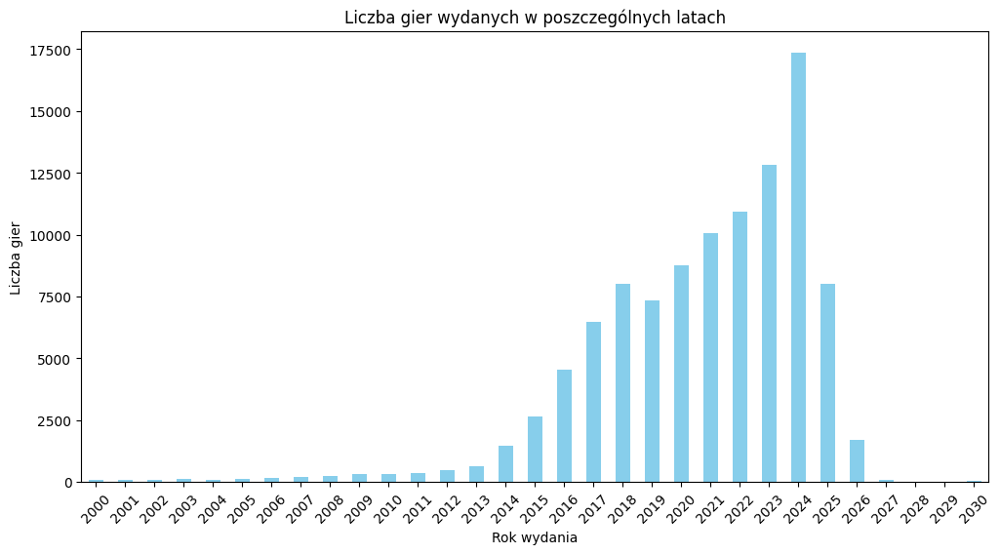

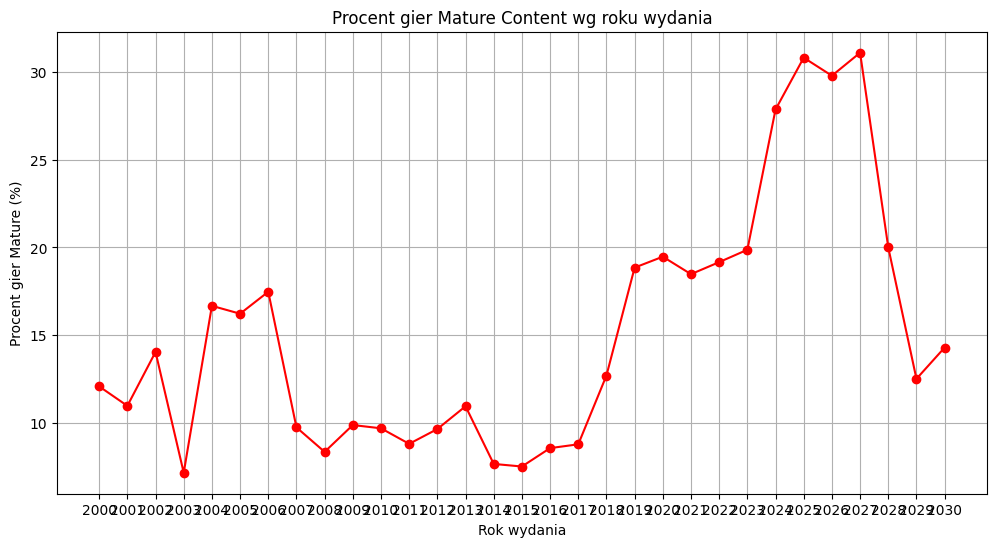

In [50]:
# Ekstrakcja roku wydania
def extract_year(date_str):
    try:
        return int(date_str.strip()[-4:])
    except:
        return None

games_df['release_year'] = games_df['release_date'].apply(extract_year)
# Liczba gier wg roku
games_per_year = games_df.groupby('release_year').size()

plt.figure(figsize=(12,6))
games_per_year.loc[2000:2030].plot(kind='bar', color='skyblue')
plt.title("Liczba gier wydanych w poszczególnych latach")
plt.xlabel("Rok wydania")
plt.ylabel("Liczba gier")
plt.xticks(ticks=range(0, len(games_per_year.loc[2000:2030])),
           labels=games_per_year.loc[2000:2030].index.astype(int), rotation=45)
plt.show()

# Procent gier Mature wg roku
mature_per_year = games_df.groupby('release_year')['is_mature'].mean() * 100

# Zawężenie do lat 2000-2030
mature_per_year = mature_per_year[(mature_per_year.index >= 2000) & (mature_per_year.index <= 2030)]

plt.figure(figsize=(12,6))
plt.plot(mature_per_year.index, mature_per_year.values, marker='o', color='red')
plt.title("Procent gier Mature Content wg roku wydania")
plt.xlabel("Rok wydania")
plt.ylabel("Procent gier Mature (%)")
plt.xticks(mature_per_year.index)  # wyświetli wszystkie lata jako int
plt.grid(True)
plt.show()



### Analiza deweloperów

TOP 10 deweloperów wg liczby gier Mature Content:
CyberStep, Inc.            54 gier Mature /  59 gier  ( 91.5%)
Rideon Works Co. Ltd,      49 gier Mature /  49 gier  (100.0%)
Winged Cloud               47 gier Mature /  50 gier  ( 94.0%)
Anamik Majumdar            32 gier Mature /  52 gier  ( 61.5%)
Hunny Bunny Studio         29 gier Mature /  29 gier  (100.0%)
Vidas Salavejus            28 gier Mature /  33 gier  ( 84.8%)
Tero Lunkka                28 gier Mature /  89 gier  ( 31.5%)
Lovely Games               27 gier Mature /  29 gier  ( 93.1%)
Frontwing                  27 gier Mature /  32 gier  ( 84.4%)
Square Enix                26 gier Mature / 109 gier  ( 23.9%)


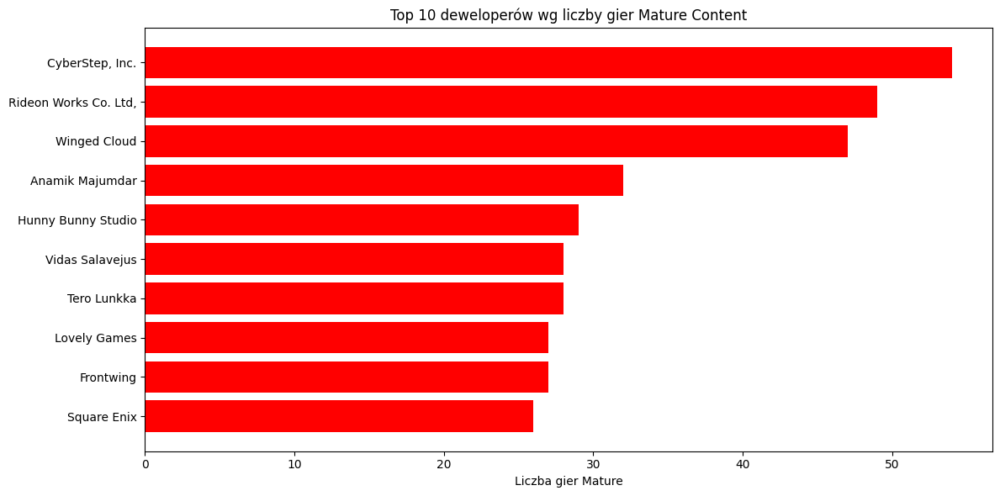

In [52]:
dev_mature_stats = defaultdict(lambda: {'total': 0, 'mature': 0})

for game in all_games:
    developers = game.get('developer', [])
    has_mature = bool(game.get('mature_content'))

    for dev in developers:
        dev_mature_stats[dev]['total'] += 1
        if has_mature:
            dev_mature_stats[dev]['mature'] += 1

# Zrób listę dla wszystkich deweloperów z min 1 grą Mature
dev_analysis = []
for dev, stats in dev_mature_stats.items():
    if stats['mature'] > 0:  # przynajmniej jedna gra mature
        pct = (stats['mature'] / stats['total']) * 100
        dev_analysis.append({
            'developer': dev,
            'total_games': stats['total'],
            'mature_games': stats['mature'],
            'mature_pct': pct
        })

# Sortowanie po liczbie gier Mature (malejąco)
dev_df = pd.DataFrame(dev_analysis).sort_values(['mature_games', 'mature_pct'], ascending=[False, False])

print("TOP 10 deweloperów wg liczby gier Mature Content:")
for idx, row in dev_df.head(10).iterrows():
    print(f"{row['developer']:25s} {row['mature_games']:3d} gier Mature / {row['total_games']:3d} gier  ({row['mature_pct']:5.1f}%)")

# Wizualizacja
plt.figure(figsize=(12,6))
top10 = dev_df.head(10)
plt.barh(top10['developer'], top10['mature_games'], color='red')
plt.xlabel('Liczba gier Mature')
plt.title('Top 10 deweloperów wg liczby gier Mature Content')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


### Lista słów kluczowych mature content

In [53]:
# Lista słów kluczowych mature content
maturity_keywords = set([
    'violence', 'blood', 'gore', 'death', 'killing', 'murder', 'combat', 'fight', 'war', 'battle', 'shooting', 'gun', 'weapon',
    'sexual', 'nudity', 'sex', 'porn', 'erotic', 'adult', 'intimate', 'romance', 'dating',
    'language', 'swearing', 'profanity', 'curse', 'foul', 'obscene',
    'drugs', 'alcohol', 'substance', 'gambling', 'addiction', 'smoking', 'cigarette',
    'horror', 'scary', 'fear', 'terror', 'nightmare', 'zombie', 'monster', 'ghost', 'supernatural', 'haunted', 'spooky',
    'dark', 'grim', 'disturbing', 'intense', 'graphic', 'realistic', 'brutal', 'savage', 'cruel'
])

# Funkcja ekstrakcji słów kluczowych z tekstu
def extract_keywords(text):
    if not text:
        return []
    text = re.sub(r'[^\w\s]', '', text.lower())
    words = text.split()
    return [w for w in words if w in maturity_keywords]

# Zbierz wszystkie słowa z gier Mature
all_mature_keywords = []
for game in all_games:
    content = game.get('mature_content')
    if content:
        all_mature_keywords.extend(extract_keywords(content))

# Policz najczęstsze słowa
keyword_counts = Counter(all_mature_keywords)
top_keywords = keyword_counts.most_common(10)

print("Top 10 słów kluczowych w grach Mature Content:")
for word, count in top_keywords:
    print(f"{word}: {count} razy")


Top 10 słów kluczowych w grach Mature Content:
violence: 11238 razy
gore: 6213 razy
blood: 5717 razy
sexual: 3475 razy
language: 2614 razy
nudity: 2556 razy
alcohol: 1722 razy
horror: 1230 razy
death: 1218 razy
graphic: 798 razy


# Gry o tematyce erotycznej

TOP 10 deweloperów wg liczby gier Sexual Mature:
Hunny Bunny Studio         27 gier Sexual /  29 gier  ( 93.1%)
Winged Cloud               25 gier Sexual /  50 gier  ( 50.0%)
CyberStep, Inc.            24 gier Sexual /  59 gier  ( 40.7%)
Rideon Works Co. Ltd,      22 gier Sexual /  49 gier  ( 44.9%)
Lovely Games               21 gier Sexual /  29 gier  ( 72.4%)
Zoo Corporation            21 gier Sexual /  37 gier  ( 56.8%)
Ryu Ga Gotoku Studio       17 gier Sexual /  18 gier  ( 94.4%)
Winter Wolves              17 gier Sexual /  33 gier  ( 51.5%)
Stegalosaurus Game Development  17 gier Sexual /  47 gier  ( 36.2%)
Dirty Fox Games            16 gier Sexual /  23 gier  ( 69.6%)


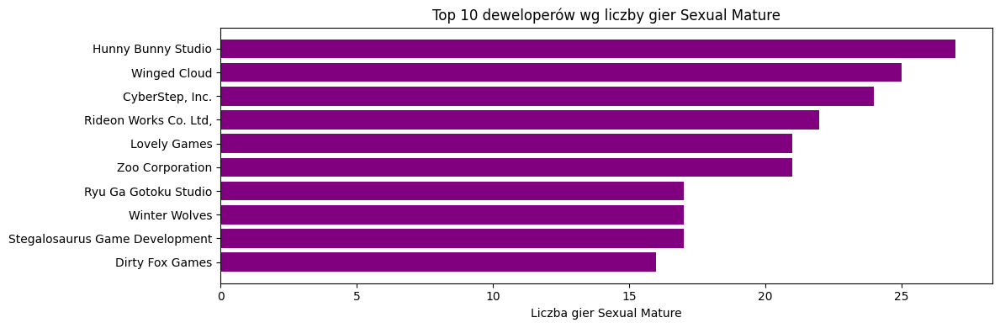

In [55]:
# Lista słów kluczowych seksualnych
sexual_keywords = set([
    'sex', 'sexual', 'nudity', 'porn', 'erotic', 'adult', 'intimate', 'romance', 'dating'
])

# Funkcja sprawdzająca, czy gra jest sexual mature
def is_sexual_mature(text):
    if not text:
        return False
    text = re.sub(r'[^\w\s]', '', text.lower())
    words = set(text.split())
    return bool(words & sexual_keywords)  # True jeśli występuje choć jedno słowo

# Licznik gier sexual mature dla deweloperów
dev_sexual_stats = defaultdict(lambda: {'total': 0, 'sexual_mature': 0})

for game in all_games:
    developers = game.get('developer', [])
    dev_sexual_stats_total = 1  # każda gra liczy się w total
    sexual_mature = is_sexual_mature(game.get('mature_content'))

    for dev in developers:
        dev_sexual_stats[dev]['total'] += 1
        if sexual_mature:
            dev_sexual_stats[dev]['sexual_mature'] += 1

# Lista deweloperów z min. 1 grą sexual mature
dev_analysis = []
for dev, stats in dev_sexual_stats.items():
    if stats['sexual_mature'] > 0:
        pct = (stats['sexual_mature'] / stats['total']) * 100
        dev_analysis.append({
            'developer': dev,
            'total_games': stats['total'],
            'sexual_mature_games': stats['sexual_mature'],
            'sexual_mature_pct': pct
        })

# Sortowanie po liczbie gier sexual mature (malejąco)
dev_df = pd.DataFrame(dev_analysis).sort_values(['sexual_mature_games', 'sexual_mature_pct'], ascending=[False, False])

print("TOP 10 deweloperów wg liczby gier Sexual Mature:")
for idx, row in dev_df.head(10).iterrows():
    print(f"{row['developer']:25s} {row['sexual_mature_games']:3d} gier Sexual / {row['total_games']:3d} gier  ({row['sexual_mature_pct']:5.1f}%)")

# Wizualizacja
plt.figure(figsize=(12,4))
top10 = dev_df.head(10)
plt.barh(top10['developer'], top10['sexual_mature_games'], color='purple')
plt.xlabel('Liczba gier Sexual Mature')
plt.title('Top 10 deweloperów wg liczby gier Sexual Mature')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()
